In [19]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io.wavfile import read, write
from scipy import signal
from numpy.fft import fft, ifft, rfft
from IPython.display import Audio

In [20]:
Fs_1, data_1 = read('test_audio.wav')
data_1 = data_1[:,0]
Audio(data_1, rate=Fs_1) 

In [21]:
upsampled_3 = np.zeros(len(data_1)*3)

for i in range(len(upsampled_3)):
    if ((i%3) == 0):
        upsampled_3[i] = data_1[i//3]

Audio(upsampled_3, rate=Fs_1) 

Text(0.5, 0, 'Frequency [Hz]')

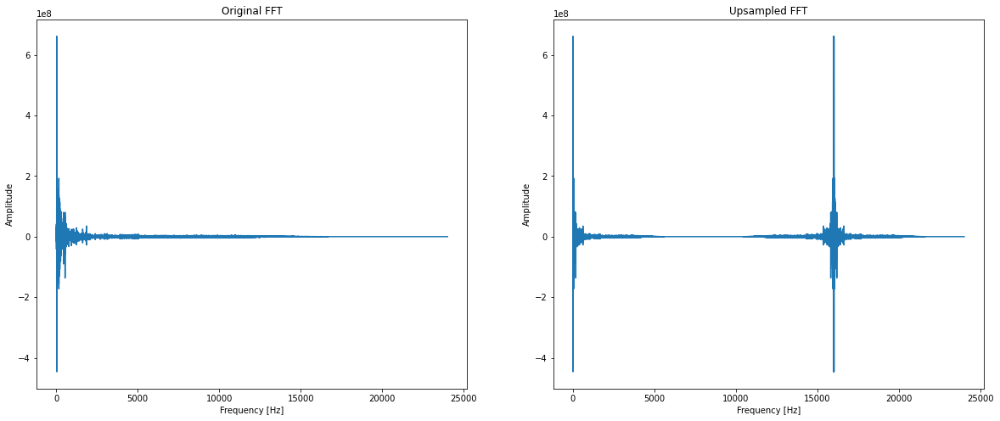

In [22]:
fft_og = rfft(data_1)
freq_og = np.linspace(0, Fs_1/2, len(fft_og))
fft_upsampled = rfft(upsampled_3)
freq_upsampled = np.linspace(0, Fs_1/2, len(fft_upsampled))
plt.figure(figsize=(20,8))
plt.subplot(121)
plt.plot(freq_og, fft_og)
plt.title("Original FFT")
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.subplot(122)
plt.plot(freq_upsampled, fft_upsampled)
plt.title("Upsampled FFT")
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")

#### What is the relationship between the original signal's FFT and the upsampled signal's FFT?

#### How do we preserve the original information without introducing aliasing?

In [23]:
downsampled_2 = data_1[::2]

Audio(downsampled_2, rate=Fs_1) 

Text(0.5, 0, 'Frequency [Hz]')

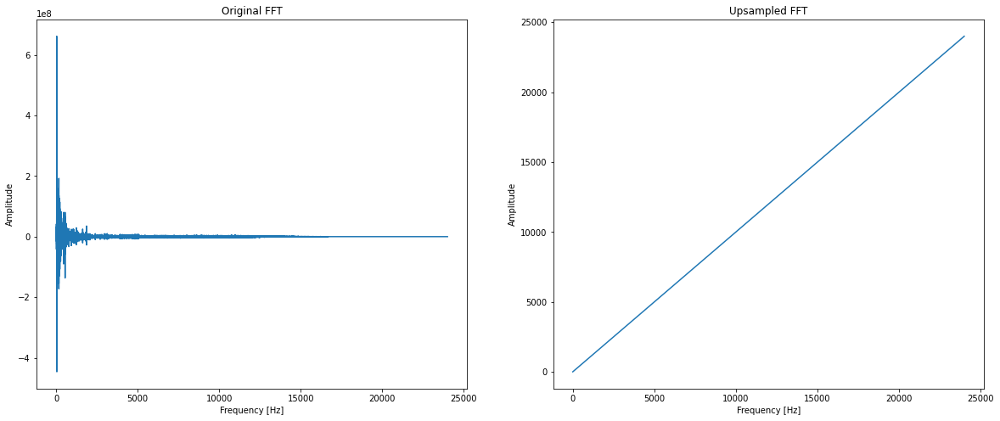

In [24]:
fft_og = rfft(data_1)
freq_og = np.linspace(0, Fs_1/2, len(fft_og))
fft_downsampled = rfft(downsampled_2)
freq_downsampled = np.linspace(0, Fs_1/2, len(fft_downsampled))
plt.figure(figsize=(20,8))
plt.subplot(121)
plt.plot(freq_og, fft_og)
plt.title("Original FFT")
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")
plt.subplot(122)
plt.plot(freq_downsampled, freq_downsampled)
plt.title("Upsampled FFT")
plt.ylabel("Amplitude")
plt.xlabel("Frequency [Hz]")

#### What is the relationship between the original signal's FFT and the downsampled signal's FFT?

#### How do we preserve the original information without introducing aliasing?

In [28]:
Fs, data = read('test_audio.wav')
data = data[:, 0]

up_ratio = 4
down_ratio = 2

output = signal.resample_poly(data, up_ratio, down_ratio)

Audio(output, rate=Fs)